# 07b MPP integration and preprocessing

Had to rerun with the old scanpy 1.4.4.post1 otherwise not compatible with Signac/Seurat

Run with this command in docker container

docker run --rm -d --name scanpy_old -p 8881:8888 -e JUPYTER_ENABLE_LAB=YES -v /Users/efast/Documents/:/home/jovyan/work evafast1/r_scanpy:vs3

# 1) Loading packages + data

In [1]:
%reset

Once deleted, variables cannot be recovered. Proceed (y/[n])?  y


In [2]:
%matplotlib inline

import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sb

In [3]:
sc.settings.set_figure_params(dpi=80)

In [4]:
plt.rcParams['figure.figsize']=(8,8) #rescale figures

In [5]:
# read MPPs

adata_ct = sc.read('./sc_objects/demuxannotated_ctprop_old_scanpy.h5ad', var_names='gene_symbols')
adata_indo = sc.read('./sc_objects/demuxannotated_indoprop_old_scanpy.h5ad', var_names='gene_symbols')
adata_GCSF = sc.read('./sc_objects/demuxannotated_GCSFprop_old_scanpy.h5ad', var_names='gene_symbols')
adata_dmPGE2 = sc.read('./sc_objects/demuxannotated_dmPGE2prop_old_scanpy.h5ad', var_names='gene_symbols')
adata_pIC = sc.read('./sc_objects/demuxannotated_pICprop_old_scanpy.h5ad', var_names='gene_symbols')

In [6]:
adata = adata_ct.concatenate(adata_indo, 
                             adata_GCSF, 
                             adata_dmPGE2, 
                             adata_pIC,
                             batch_key='sample',
                             batch_categories=['ct', 'indo', 'GCSF', 'dmPGE2', 'pIC'],
                             index_unique=None
                             ) #batch

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Or pass `index_unique!=None` to `.concatenate`.


In [7]:
adata

AnnData object with n_obs × n_vars = 9108 × 31053 
    obs: 'assignment', 'counts', 'demux_type', 'hto_type', 'rna_type', 'sample', 'select_cells'
    var: 'gene_ids', 'feature_types'

In [8]:
adata.obs_names_make_unique(join='_')

In [9]:
adata_ct = None
adata_indo = None
adata_GCSF = None
adata_dmPGE2 = None
adata_pIC = None

In [10]:
# read LTs

adata_ct = sc.read('./sc_objects/demuxannotated_ct_LT_prop_old_scanpy.h5ad', var_names='gene_symbols', cache=True)
adata_indo = sc.read('./sc_objects/demuxannotated_indo_LT_prop_old_scanpy.h5ad', var_names='gene_symbols', cache=True)
adata_GCSF = sc.read('./sc_objects/demuxannotated_GCSF_LT_prop_old_scanpy.h5ad', var_names='gene_symbols', cache=True)
adata_dmPGE2 = sc.read('./sc_objects/demuxannotated_dmPGE2_LT_prop_old_scanpy.h5ad', var_names='gene_symbols', cache=True)
adata_pIC = sc.read('./sc_objects/demuxannotated_pIC_LT_prop_old_scanpy.h5ad', var_names='gene_symbols', cache=True)

In [11]:
adata_LT = adata_ct.concatenate(adata_indo, 
                             adata_GCSF, 
                             adata_dmPGE2, 
                             adata_pIC,
                             batch_key='sample',
                             batch_categories=['ct', 'indo', 'GCSF', 'dmPGE2', 'pIC'],
                             index_unique=None
                             ) #batch

In [12]:
adata_LT

AnnData object with n_obs × n_vars = 149 × 31053 
    obs: 'assignment', 'sample', 'select_cells'
    var: 'gene_ids', 'feature_types'

In [13]:
# combine LT and MPPs
adata = adata.concatenate(adata_LT) #batch

In [14]:
adata

AnnData object with n_obs × n_vars = 9257 × 31053 
    obs: 'assignment', 'batch', 'counts', 'demux_type', 'hto_type', 'rna_type', 'sample', 'select_cells'
    var: 'gene_ids', 'feature_types'

In [15]:
adata.obs['sample'].value_counts()

pIC       2480
dmPGE2    2239
GCSF      1890
indo      1660
ct         988
Name: sample, dtype: int64

In [16]:
adata_ct = None
adata_indo = None
adata_GCSF = None
adata_dmPGE2 = None
adata_pIC = None
adata_LT = None

# 2) Pre-processing and visualization

## 2.1 Quality control

Data quality control can be split into cell QC and gene QC. Typical quality measures for assessing the quality of a cell include the number of molecule counts (UMIs), the number of expressed genes, and the fraction of counts that are mitochondrial. A high fraction of mitochondrial reads being picked up can indicate cell stress, as there is a low proportion of nuclear mRNA in the cell. It should be noted that high mitochondrial RNA fractions can also be biological signals indicating elevated respiration.

In [17]:
# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

In [18]:
# create metacolums in adata.obs for percentage mitochondrial counts and total counts/gene
mito_genes = adata.var_names.str.startswith('mt-')

In [19]:
# add the percent mitochondria to the adata.obs
adata.obs['percent_mito'] = np.sum(
    adata[:, mito_genes].X, axis=1) / np.sum(adata.X, axis=1)

/opt/conda/lib/python3.7/site-packages/anndata/core/anndata.py:846: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


(array([4.577e+03, 3.370e+02, 5.250e+02, 5.620e+02, 5.360e+02, 4.270e+02,
        4.050e+02, 4.320e+02, 2.910e+02, 2.350e+02, 2.010e+02, 1.880e+02,
        1.330e+02, 1.060e+02, 1.000e+02, 4.300e+01, 4.200e+01, 3.300e+01,
        1.600e+01, 1.500e+01, 1.200e+01, 9.000e+00, 2.000e+00, 1.200e+01,
        8.000e+00, 0.000e+00, 0.000e+00, 3.000e+00, 3.000e+00, 1.000e+00,
        1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 1.000e+00]),
 array([  0.  ,   4.14,   8.28,  12.42,  16.56,  20.7 ,  24.84,  28.98,
         33.12,  37.26,  41.4 ,  45.54,  49.68,  53.82,  57.96,  62.1 ,
         66.24,  70.38,  74.52,  78.66,  82.8 ,  86.94,  91.08,  95.22,
         99.36, 103.5 , 107.64, 111.78, 115.92, 120.06, 124.2 , 128.34,
        132.48, 136.62, 140.76, 144.9 , 149.04, 153.18, 157.32, 161.46,
        165.6 , 

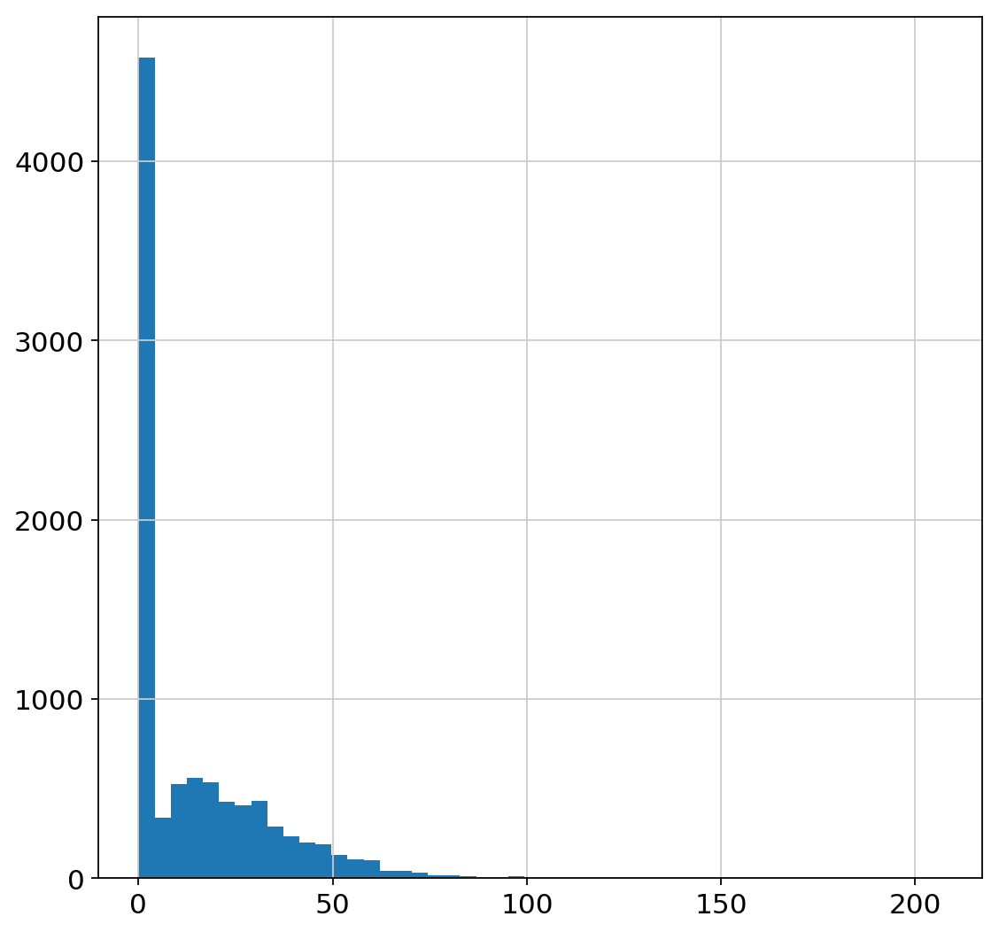

In [20]:
plt.hist(adata[: , 'Xist'].X, bins=50)

In [21]:
# add in the Xist metadata to the adata.obs

adata.obs['Female'] = adata[: , 'Xist'].X > 0 # make a column in adata.obs to identify female cells
adata.obs['Female_cat']=adata.obs['Female'].astype('category', copy=True) # make a column with category as dtype

In [22]:
### Make a metacolumn that stores male and female cells

adata.obs['Female_str'] = adata.obs['Female'].map(lambda x: str(x).lower() if isinstance(x, bool) else  x)
adata.obs['sex_sample'] = adata.obs['sample'].str.cat(others = adata.obs['Female_str'], sep='_')
adata.obs['sex_sample']=adata.obs['sex_sample'].astype('category', copy=True) # make a column with category as dtype

In [23]:
# make a metacolumn that sto
adata.obs['sex_sample'].value_counts()

pIC_true        1285
pIC_false       1195
dmPGE2_true     1173
dmPGE2_false    1066
GCSF_true       1054
indo_true        919
GCSF_false       836
indo_false       741
ct_true          508
ct_false         480
Name: sex_sample, dtype: int64

In [24]:
plt.rcParams['figure.figsize']=(12,8) #rescale figures

... storing 'assignment' as categorical
... storing 'demux_type' as categorical
... storing 'hto_type' as categorical
... storing 'rna_type' as categorical
... storing 'Female_str' as categorical
... storing 'feature_types' as categorical


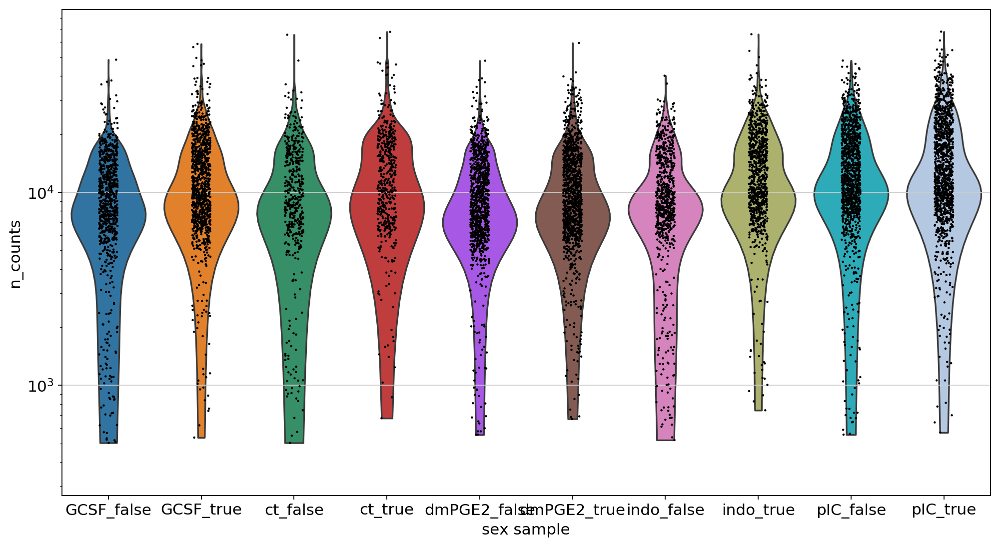

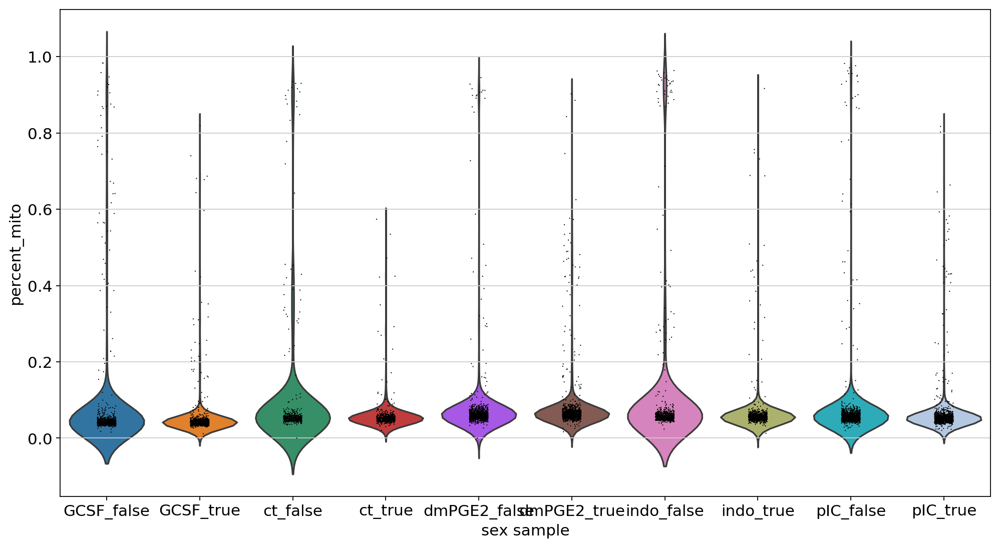

In [25]:
# Quality control - plot QC metrics
#Sample quality plots
t1 = sc.pl.violin(adata, 'n_counts', groupby='sex_sample', size=2, log=True, cut=0)
t2 = sc.pl.violin(adata, 'percent_mito', groupby='sex_sample')

looks like the sequencing depth and the amount of dead cells is pretty similar

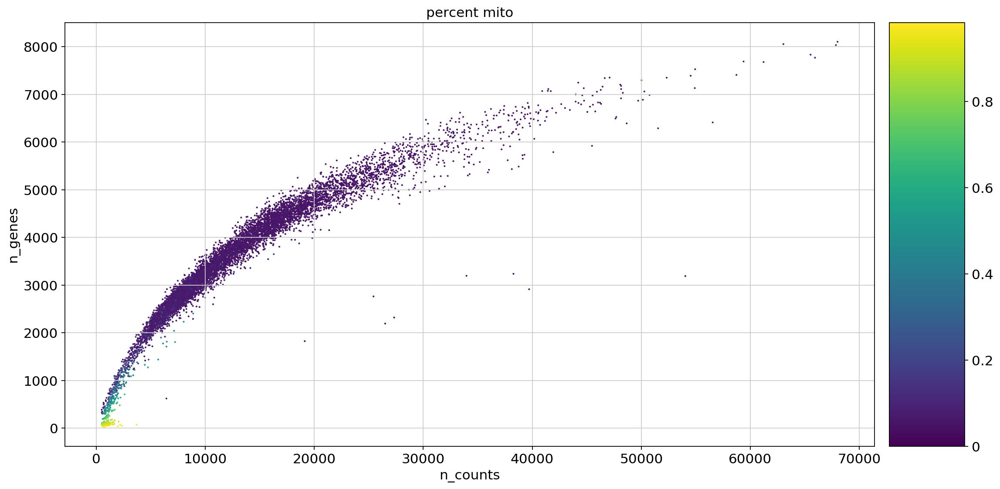

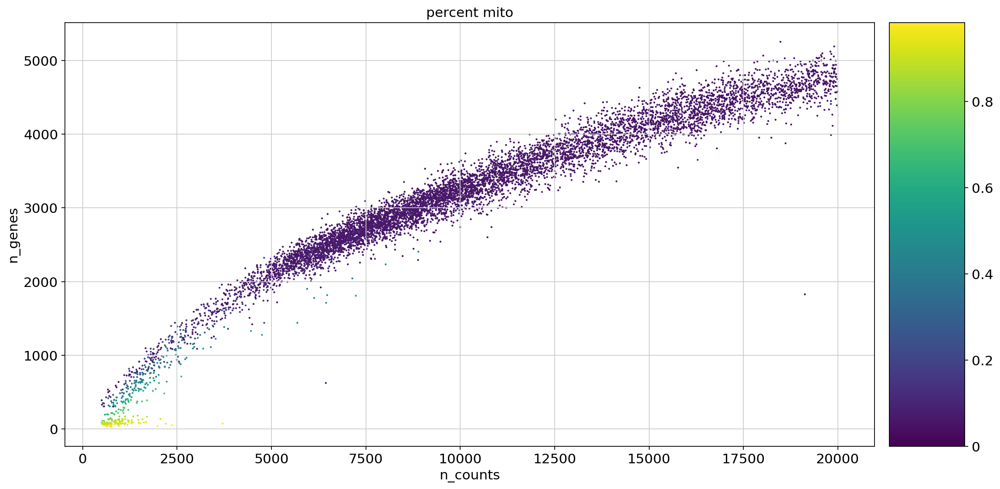

In [26]:
#Data quality summary plots
p1 = sc.pl.scatter(adata, 'n_counts', 'n_genes', color='percent_mito')
p2 = sc.pl.scatter(adata[adata.obs['n_counts']<20000], 'n_counts', 'n_genes', color='percent_mito')

the cells that have really high n_counts also have not many genes - so these cells are likely dead

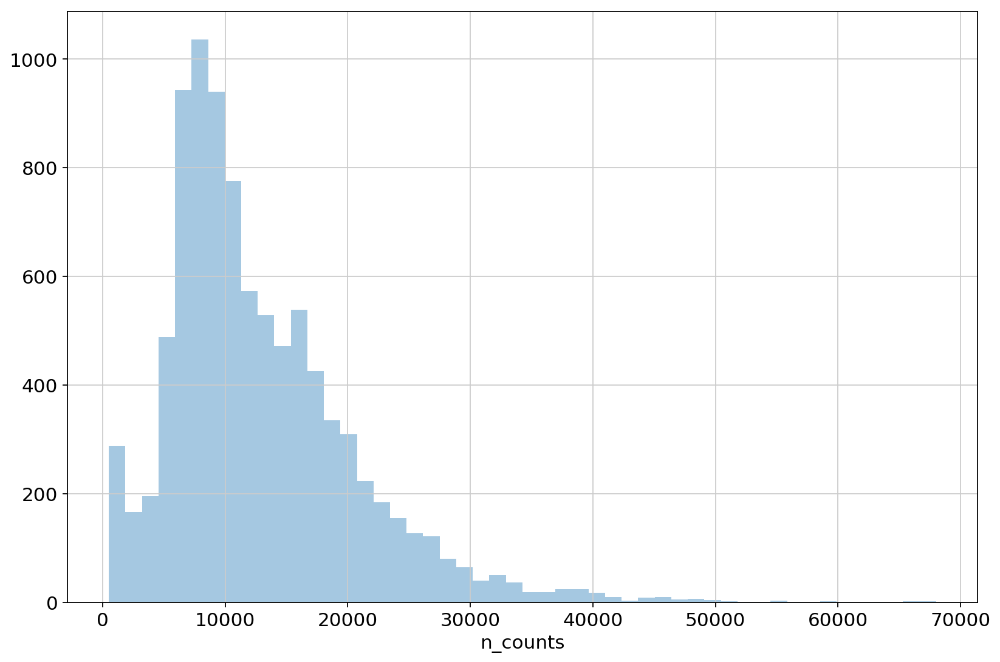

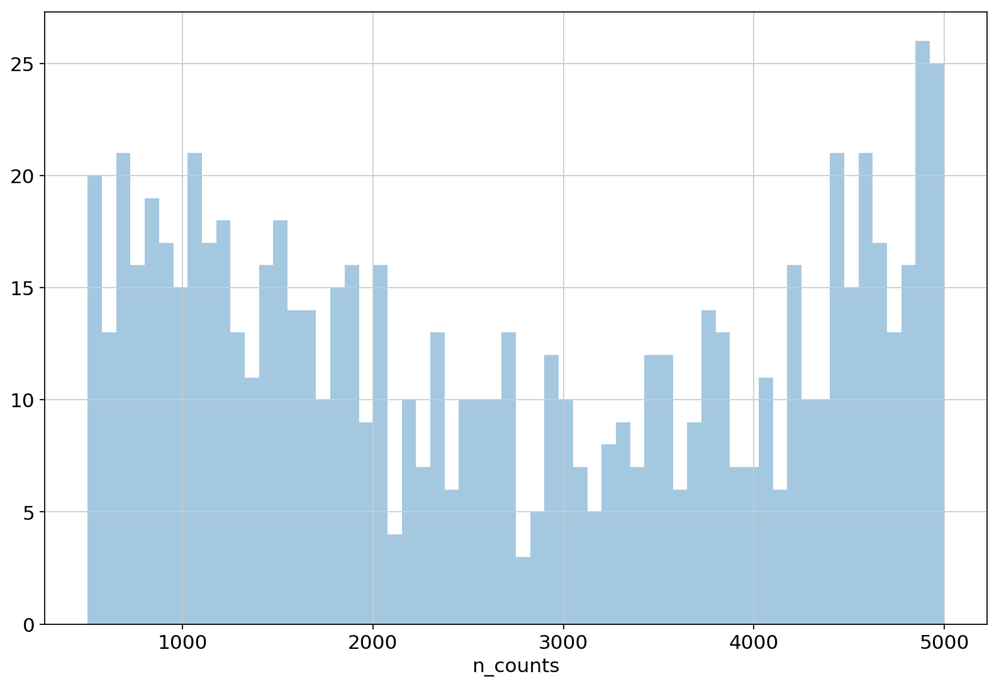

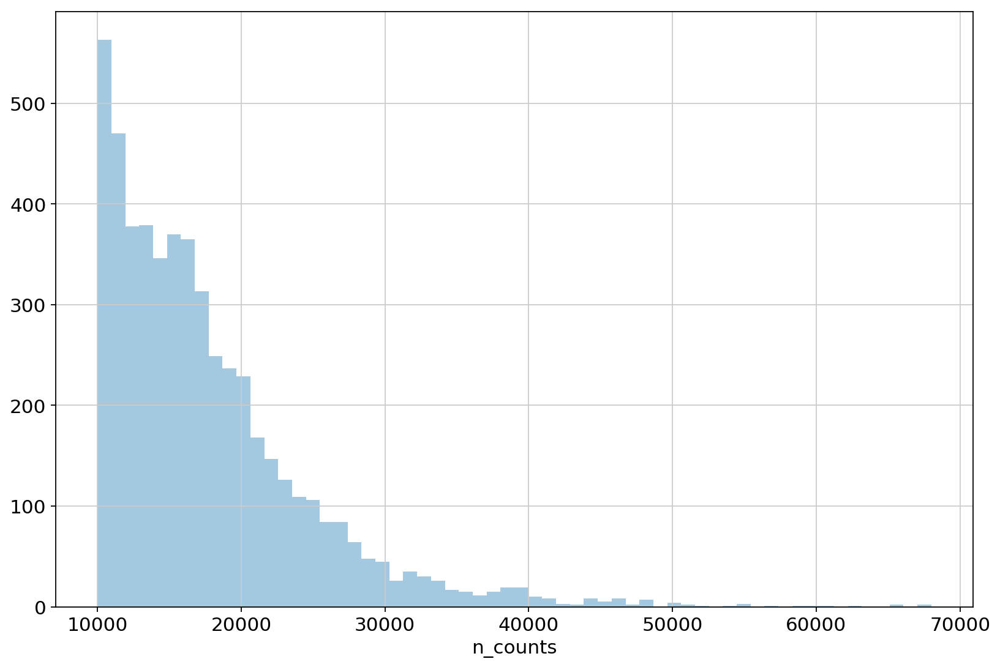

In [27]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<5000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>10000], kde=False, bins=60)
plt.show()

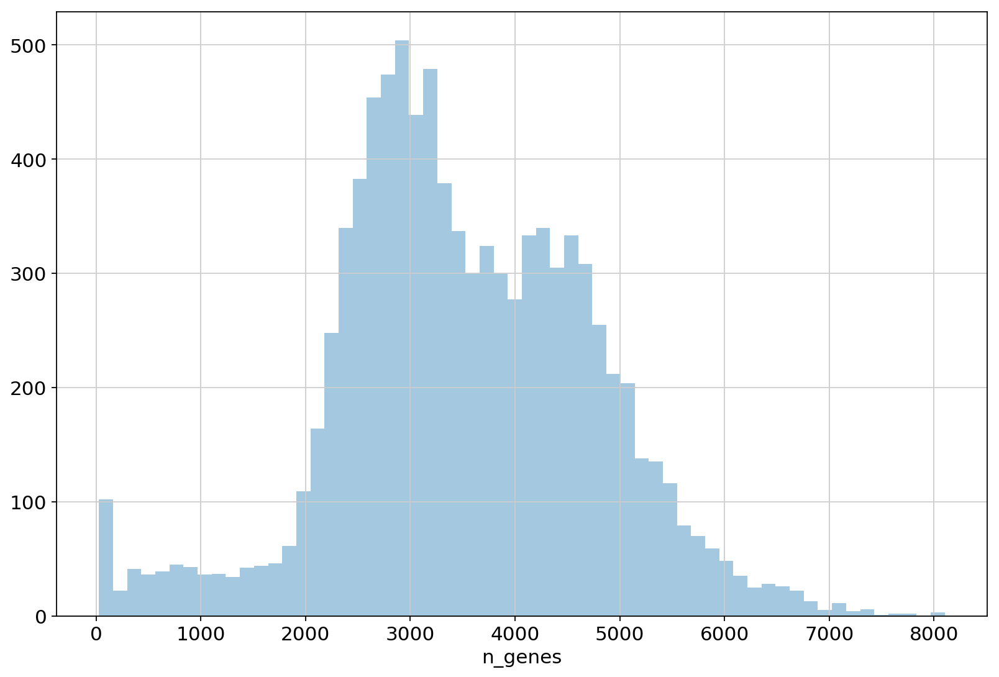

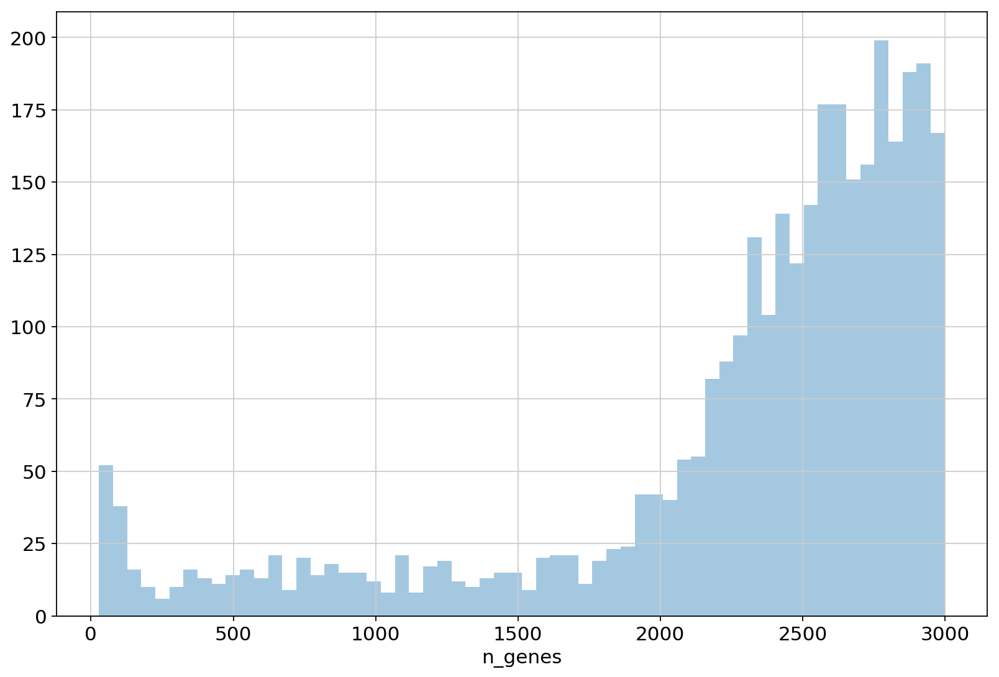

In [28]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes']<3000], kde=False, bins=60)
plt.show()


In [29]:
# Filter cells according to identified QC thresholds:
# leave filtering criteria relatively loose - can be made more stringent later

print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_counts = 3000)
print('Number of cells after min count filter: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 30000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['percent_mito'] < 0.1]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 2000)
print('Number of cells after gene filter: {:d}'.format(adata.n_obs))

Total number of cells: 9257
Number of cells after min count filter: 8821
Number of cells after max count filter: 8519
Number of cells after MT filter: 8386


Trying to set attribute `.obs` of view, making a copy.


Number of cells after gene filter: 8191


In [30]:
# Filter out genes that are expressed in very few cells

#Filter genes:
print('Total number of genes: {:d}'.format(adata.n_vars))

# Min 20 cells - filters out 0 count genes
sc.pp.filter_genes(adata, min_cells=20)
print('Number of genes after cell filter: {:d}'.format(adata.n_vars))

Total number of genes: 31053
Number of genes after cell filter: 13827


In [31]:
# normalize to 10K counts/cell and logtransform
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

In [32]:
adata.raw = adata

In [33]:
adata

AnnData object with n_obs × n_vars = 8191 × 13827 
    obs: 'assignment', 'batch', 'counts', 'demux_type', 'hto_type', 'rna_type', 'sample', 'select_cells', 'n_counts', 'log_counts', 'n_genes', 'percent_mito', 'Female', 'Female_cat', 'Female_str', 'sex_sample'
    var: 'gene_ids', 'feature_types', 'n_cells'

## 2.2 Batch correction

In [34]:
# make a new column with identifying the batches
adata.obs['batch'] = adata.obs['sample']

adata.obs['batch'] = adata.obs['batch'].apply(lambda x: 'batch1' if x == 'ct' else x)
adata.obs['batch'] = adata.obs['batch'].apply(lambda x: 'batch1' if x == 'indo' else x)
adata.obs['batch'] = adata.obs['batch'].apply(lambda x: 'batch2' if x == 'dmPGE2' else x)
adata.obs['batch'] = adata.obs['batch'].apply(lambda x: 'batch2' if x == 'pIC' else x)
adata.obs['batch'] = adata.obs['batch'].apply(lambda x: 'batch3' if x == 'GCSF' else x)

In [35]:
# ComBat batch correction
sc.pp.combat(adata, key='batch')

... storing 'batch' as categorical
/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_combat.py:269: NumbaWarning: 
Compilation is falling back to object mode WITH looplifting enabled because Function "_it_sol" failed type inference due to: Cannot unify array(float64, 2d, C) and array(float64, 1d, C) for 'sum2', defined at /opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_combat.py (311)

File "../../../../opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_combat.py", line 311:
def _it_sol(s_data, g_hat, d_hat, g_bar, t2, a, b, conv=0.0001) -> Tuple[float, float]:
    <source elided>
        g_new = (t2*n*g_hat + d_old*g_bar) / (t2*n + d_old)
        sum2 = s_data - g_new.reshape((g_new.shape[0], 1)) @ np.ones((1, s_data.shape[1]))
        ^

[1] During: typing of assignment at /opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_combat.py (313)

File "../../../../opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_combat.py", line 313:
def

In [37]:
#make column in adata.obs with corrected Xist

adata.obs['rXist'] = adata[: , 'Xist'].X + 0.01 # make a column in adata.obs that stores the actual values of Xist, add 0.01 to get rid of "0" for downstream processin 

#regresses out Xist from adata 
sc.pp.regress_out(adata, ['rXist'])

# 3) Select variable genes for downstream analysis

In [38]:
sc.pp.highly_variable_genes(adata, flavor='cell_ranger', n_top_genes=2500)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata.var['highly_variable'])))


 Number of highly variable genes: 2499


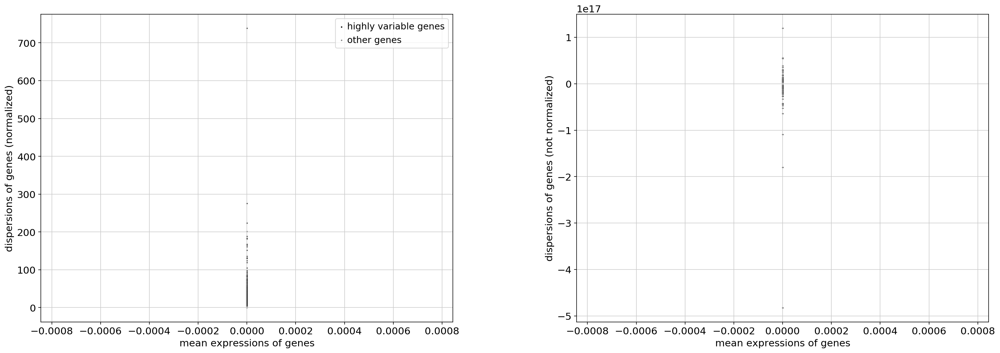

In [39]:
sc.pl.highly_variable_genes(adata)

In [40]:
adata #this now only contains the most variable genes

AnnData object with n_obs × n_vars = 8191 × 13827 
    obs: 'assignment', 'batch', 'counts', 'demux_type', 'hto_type', 'rna_type', 'sample', 'select_cells', 'n_counts', 'log_counts', 'n_genes', 'percent_mito', 'Female', 'Female_cat', 'Female_str', 'sex_sample', 'rXist'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'

In [41]:
#Scale data 
sc.pp.scale(adata, max_value=10)

# Calculate best clustering combination

In [42]:
# run PCA
sc.pp.pca(adata, n_comps=50, use_highly_variable=True, svd_solver='arpack')

In [45]:
## make loop to save different silhouette scores and Davies Bouldin scores in a dataframe

from __future__ import print_function
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.metrics import davies_bouldin_score
from tqdm import tnrange, tqdm_notebook
from time import sleep
import warnings


sc.settings.verbosity = 0   ### suppress output of scanpy
warnings.filterwarnings('ignore') # suppress Warnings
results_df=[]
results_df = pd.DataFrame(columns=['KNN', 'resolution','number_of_clusters', 'sil', 'davie_bould'])

for k in tnrange(5, 60, 5, desc ='1st loop'):
    sc.pp.neighbors(adata, n_neighbors=k, n_pcs=40);
    sc.tl.umap(adata);
    
    for i in tqdm_notebook(range(20, 130, 10), desc ='2nd loop', leave=False):
        j = i/100
        sc.tl.leiden(adata, resolution=j);
        sc.tl.rank_genes_groups(adata, 'leiden')
        silhouette_avg = silhouette_score(adata.obsm['X_pca'], adata.obs['leiden'])
        davies_bouldin_avg = davies_bouldin_score(adata.obsm['X_pca'], adata.obs['leiden'])
        results_df = results_df.append(pd.DataFrame([[k, j, max(adata.obs['leiden']), silhouette_avg, davies_bouldin_avg]], columns=['KNN', 'resolution','number_of_clusters', 'sil', 'davie_bould']))
        sleep(0.01)

In [46]:
results_df['number_of_clusters'] = results_df['number_of_clusters'].astype(float) + 1 
# need to change the object type louvain clusters are saved as object not float
# need to add 1 because it python starts counting at 0 and the total number of clusters is 1 + max

results_df

,KNN,resolution,number_of_clusters,sil,davie_bould
0,5,0.2,6.0,0.075222,2.457673
0,5,0.3,6.0,0.076179,2.437705
0,5,0.4,8.0,0.071970,2.370690
0,5,0.5,10.0,0.058541,2.535296
0,5,0.6,10.0,0.053677,2.687487
...,...,...,...,...,...
0,55,0.8,9.0,0.072833,2.721609
0,55,0.9,10.0,0.064340,2.583578
0,55,1.0,10.0,0.068989,2.592863
0,55,1.1,10.0,0.064047,2.673642


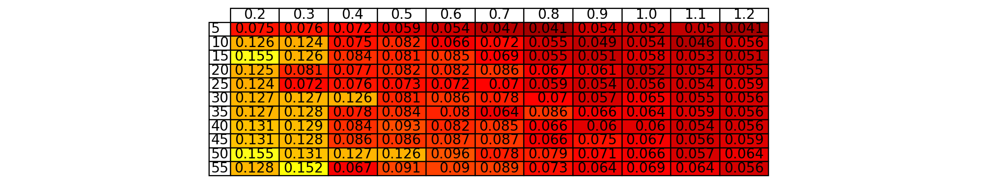

In [47]:
# Make a colored table with the silhouette scores
piv_sil = results_df.pivot(index='KNN', columns='resolution', values='sil')
vals = np.around(piv_sil.values,3) #evenly round to the given number of decimals.

norm = plt.Normalize(vals.min()-0.05, vals.max()+0.05)
colours = plt.cm.hot(norm(vals))

fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(411, frameon=False, xticks=[], yticks=[])

the_table=plt.table(cellText=vals, rowLabels=piv_sil.index, colLabels=piv_sil.columns, 
                    colWidths = [0.05]*vals.shape[1], loc='center', 
                    cellColours=colours)
plt.show()

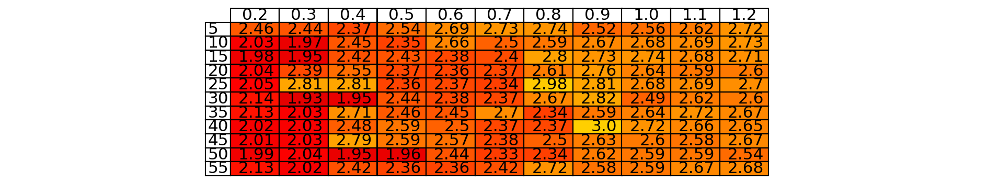

In [48]:
# Make a colored table with the Davies Bouldin scores
piv_DB = results_df.pivot(index='KNN', columns='resolution', values='davie_bould')

vals = np.around(piv_DB.values,2) #evenly round to the given number of decimals.

norm = plt.Normalize(vals.min()-1, vals.max()+1)
colours = plt.cm.hot(norm(vals))


fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(411, frameon=False, xticks=[], yticks=[])

the_table=plt.table(cellText=vals, rowLabels=piv_DB.index, colLabels=piv_DB.columns, 
                    colWidths = [0.05]*vals.shape[1], loc='center', 
                    cellColours=colours)


plt.show()

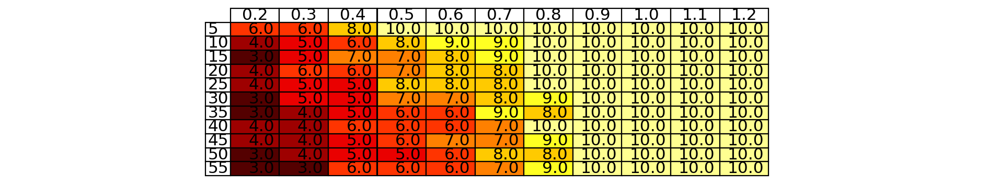

In [49]:
# Make a colored table with the number of clusters
piv_clust = results_df.pivot(index='KNN', columns='resolution', values='number_of_clusters')

vals = np.around(piv_clust.values,2) #evenly round to the given number of decimals.

norm = plt.Normalize(vals.min()-1, vals.max()+1)
colours = plt.cm.hot(norm(vals))


fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(411, frameon=False, xticks=[], yticks=[])

the_table=plt.table(cellText=vals, rowLabels=piv_clust.index, colLabels=piv_clust.columns, 
                    colWidths = [0.05]*vals.shape[1], loc='center', 
                    cellColours=colours)


plt.show()

In [50]:
max_sil = results_df[results_df.groupby('number_of_clusters')['sil'].transform('max') == results_df['sil']].sort_values(by=['number_of_clusters'])
max_sil

,KNN,resolution,number_of_clusters,sil,davie_bould
0,15,0.2,3.0,0.155344,1.978665
0,40,0.2,4.0,0.131172,2.017843
0,30,0.3,5.0,0.127066,1.925245
0,50,0.6,6.0,0.095826,2.443407
0,55,0.7,7.0,0.089056,2.420398
0,35,0.8,8.0,0.086219,2.343776
0,55,0.8,9.0,0.072833,2.721609
0,45,0.9,10.0,0.075195,2.634262


In [51]:
min_db = results_df[results_df.groupby('number_of_clusters')['davie_bould'].transform('min') == results_df['davie_bould']].sort_values(by=['number_of_clusters'])
min_db

,KNN,resolution,number_of_clusters,sil,davie_bould
0,15,0.2,3.0,0.155344,1.978665
0,45,0.2,4.0,0.130859,2.014779
0,30,0.3,5.0,0.127066,1.925245
0,55,0.5,6.0,0.091207,2.357127
0,40,0.7,7.0,0.085486,2.370445
0,50,0.7,8.0,0.078082,2.333260
0,15,0.7,9.0,0.068940,2.398797
0,40,0.8,10.0,0.065700,2.367702


<function matplotlib.pyplot.show(*args, **kw)>

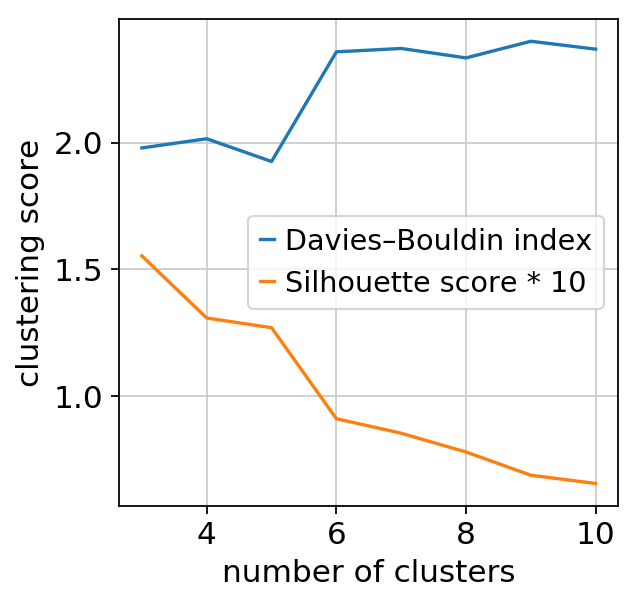

In [52]:
# plot the top value for each cluster

plt.plot(min_db['number_of_clusters'], min_db['davie_bould'])
plt.plot(max_sil['number_of_clusters'], min_db['sil'] * 10)
plt.legend(['Davies–Bouldin index','Silhouette score * 10'])
plt.xlabel('number of clusters')
plt.ylabel('clustering score')
plt.show

In [53]:
results_df[results_df['number_of_clusters'] == 6].sort_values('sil', ascending=False) 

,KNN,resolution,number_of_clusters,sil,davie_bould
0,50,0.6,6.0,0.095826,2.443407
0,40,0.5,6.0,0.093384,2.594115
0,55,0.5,6.0,0.091207,2.357127
0,55,0.6,6.0,0.089926,2.364324
0,45,0.5,6.0,0.086203,2.591492
0,35,0.5,6.0,0.083897,2.462842
0,40,0.4,6.0,0.083757,2.481934
0,40,0.6,6.0,0.081797,2.502216
0,20,0.3,6.0,0.080765,2.392252
0,35,0.6,6.0,0.079629,2.449935


In [54]:
results_df[results_df['number_of_clusters'] == 7].sort_values('sil', ascending=False) 

,KNN,resolution,number_of_clusters,sil,davie_bould
0,55,0.7,7.0,0.089056,2.420398
0,45,0.7,7.0,0.086989,2.378012
0,45,0.6,7.0,0.086770,2.568945
0,30,0.6,7.0,0.086062,2.382267
0,40,0.7,7.0,0.085486,2.370445
0,15,0.4,7.0,0.083786,2.419265
0,20,0.5,7.0,0.082123,2.373214
0,15,0.5,7.0,0.081434,2.428157
0,30,0.5,7.0,0.081079,2.441867


In [55]:
results_df[results_df['number_of_clusters'] == 8].sort_values('sil', ascending=False) 

,KNN,resolution,number_of_clusters,sil,davie_bould
0,35,0.8,8.0,0.086219,2.343776
0,20,0.7,8.0,0.085623,2.370001
0,15,0.6,8.0,0.084867,2.383952
0,10,0.5,8.0,0.081875,2.352475
0,20,0.6,8.0,0.081688,2.359910
0,50,0.8,8.0,0.078543,2.343231
0,30,0.7,8.0,0.078156,2.370470
0,50,0.7,8.0,0.078082,2.333260
0,25,0.5,8.0,0.072857,2.362815
0,25,0.6,8.0,0.072209,2.366426


In [56]:
results_df[results_df['number_of_clusters'] == 5].sort_values('sil', ascending=False) 

,KNN,resolution,number_of_clusters,sil,davie_bould
0,30,0.3,5.0,0.127066,1.925245
0,50,0.4,5.0,0.126965,1.946054
0,50,0.5,5.0,0.126353,1.955270
0,30,0.4,5.0,0.125948,1.947217
0,15,0.3,5.0,0.125643,1.949135
0,10,0.3,5.0,0.124225,1.966767
0,45,0.4,5.0,0.085563,2.793286
0,35,0.4,5.0,0.077752,2.713619
0,25,0.4,5.0,0.075806,2.808803
0,25,0.3,5.0,0.072184,2.813731


## plot different KNN + resolutions and see how the UMAP graphs actually look like

#### Leiden 7 clusters 35 KNN, 0.7 resolution - old result that worked previously

In [43]:
plt.rcParams['figure.figsize']=(4,4) #rescale figures

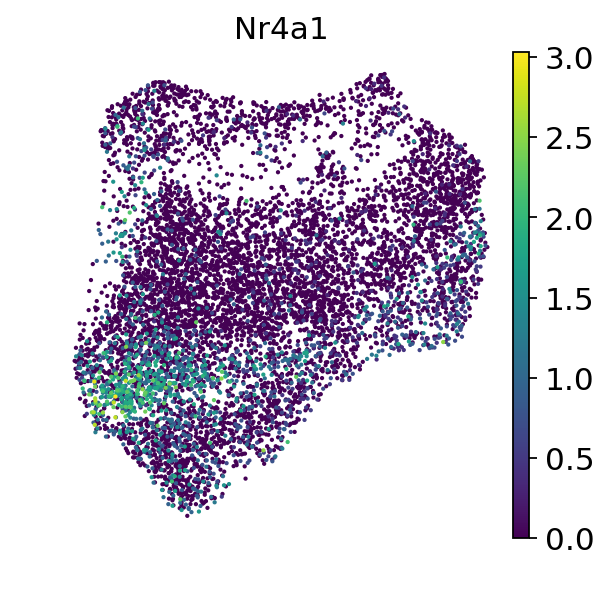

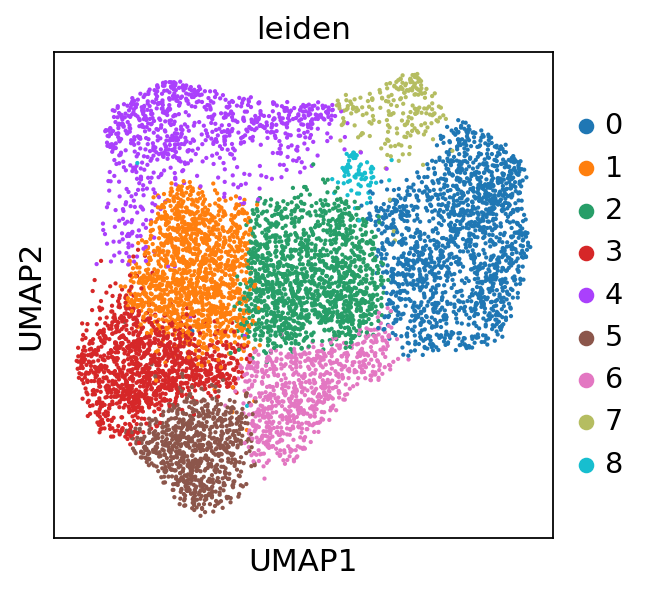

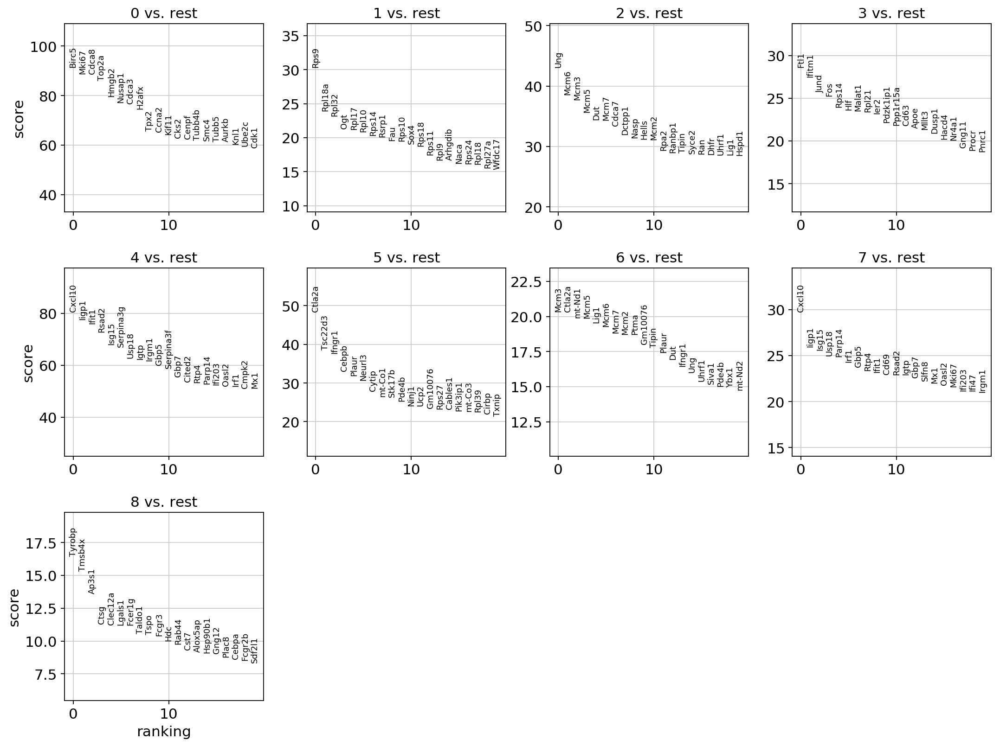

In [44]:
# redo the umap with different neigborhoods

sc.pp.neighbors(adata, n_neighbors=35, n_pcs=40)
sc.tl.umap(adata)
sc.pl.umap(adata, color=['Nr4a1'], legend_loc='on data', frameon=False)
sc.tl.leiden(adata, resolution=0.7)
sc.pl.umap(adata, color=['leiden'])
sc.tl.rank_genes_groups(adata, 'leiden')
sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

#### Leiden 8 clusters 35 KNN, 0.8 resolution - new with this version of scanpy

In [59]:
plt.rcParams['figure.figsize']=(4,4) #rescale figures

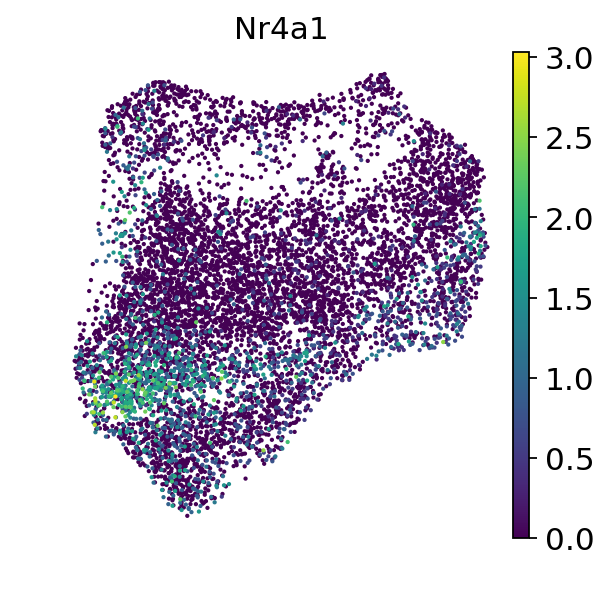

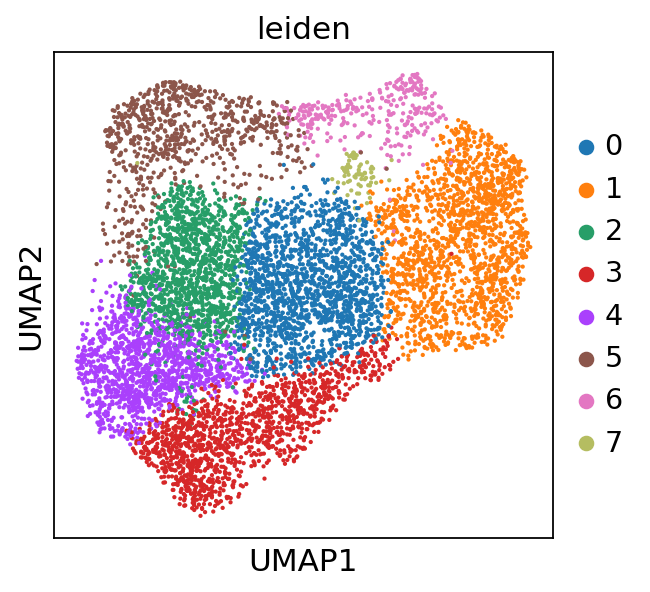

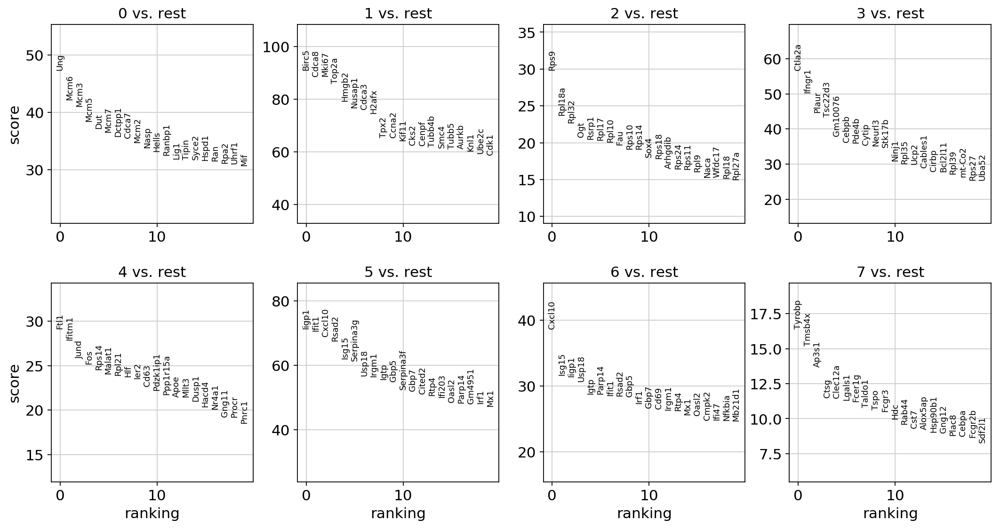

In [60]:
# redo the umap with different neigborhoods

sc.pp.neighbors(adata, n_neighbors=35, n_pcs=40)
sc.tl.umap(adata)
sc.pl.umap(adata, color=['Nr4a1'], legend_loc='on data', frameon=False)
sc.tl.leiden(adata, resolution=0.8)
sc.pl.umap(adata, color=['leiden'])
sc.tl.rank_genes_groups(adata, 'leiden')
sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

In [61]:
# Annotate the data sets
print(adata.obs['leiden'].value_counts())
print('')

0    1634
1    1606
2    1337
3    1281
4    1217
5     751
6     294
7      71
Name: leiden, dtype: int64



this looks fairly reasonable - + consistent with previous result

#### the 8 clusters seems to be a reasonable clustering result because seems to capture prognitors

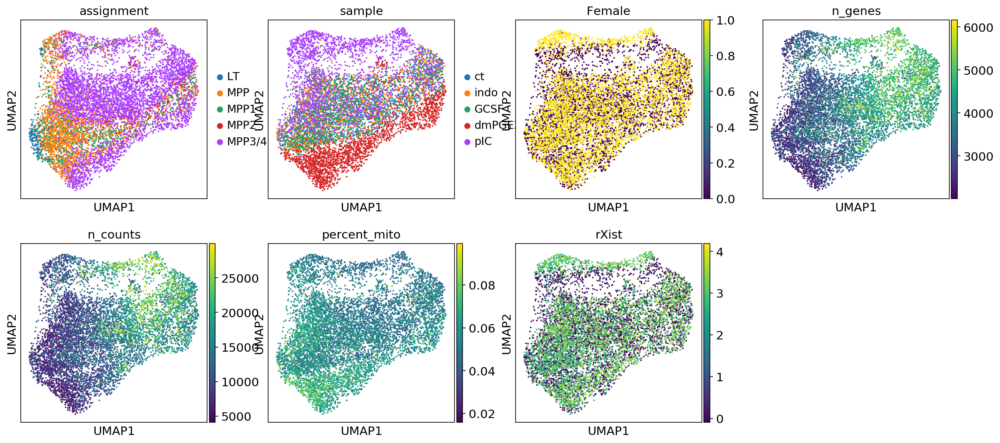

In [62]:
sc.pl.umap(adata, color=['assignment', 'sample', 'Female', 'n_genes', 'n_counts','percent_mito', 'rXist'])

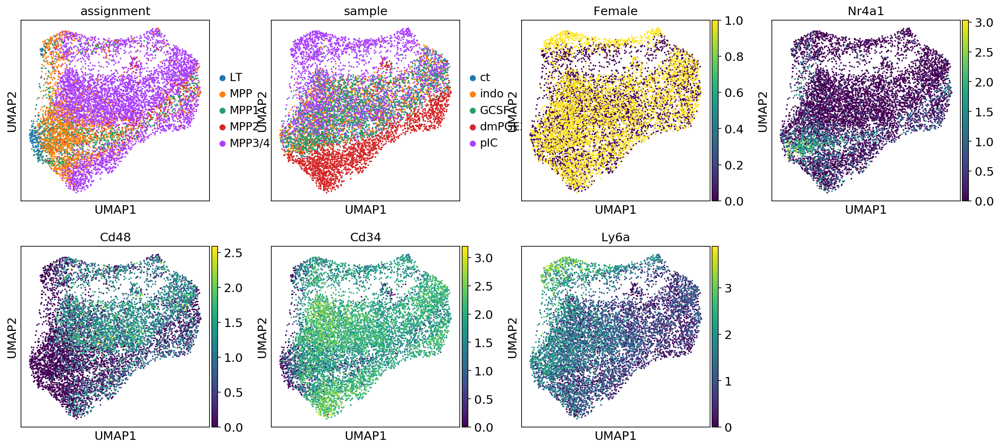

In [63]:
sc.pl.umap(adata, color=['assignment', 'sample', 'Female', 'Nr4a1', 'Cd48', 'Cd34', 'Ly6a'])

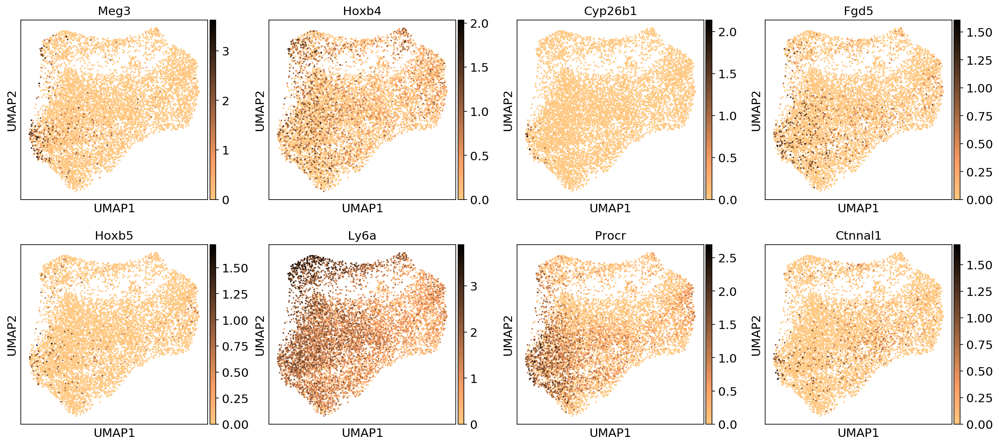

In [64]:
sc.pl.umap(adata, color=['Meg3', 'Hoxb4', 'Cyp26b1', 'Fgd5', 'Hoxb5', 'Ly6a', 'Procr', 'Ctnnal1'], cmap = 'copper_r')

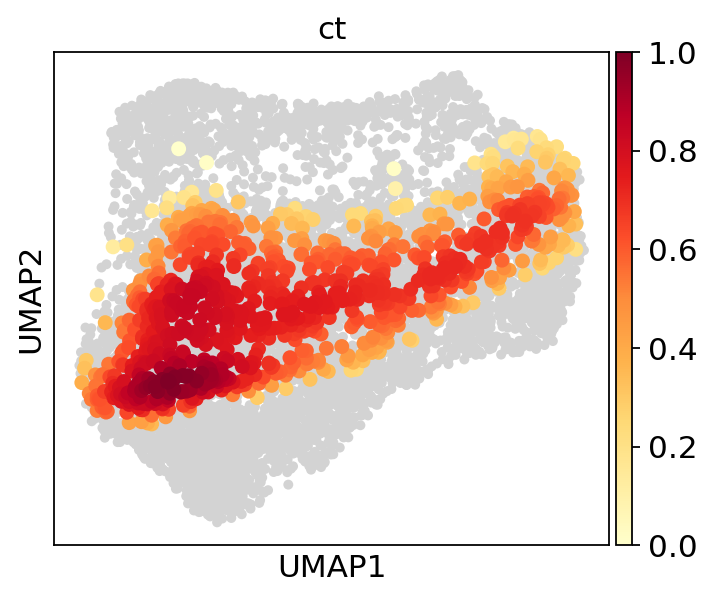

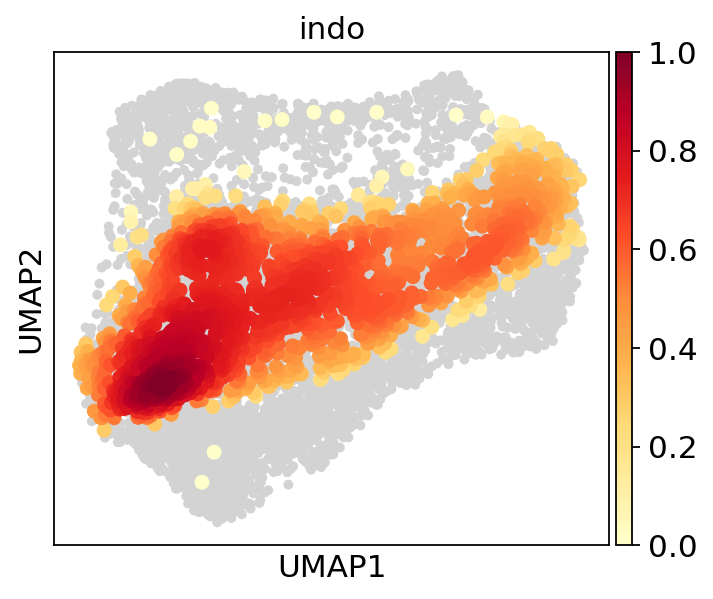

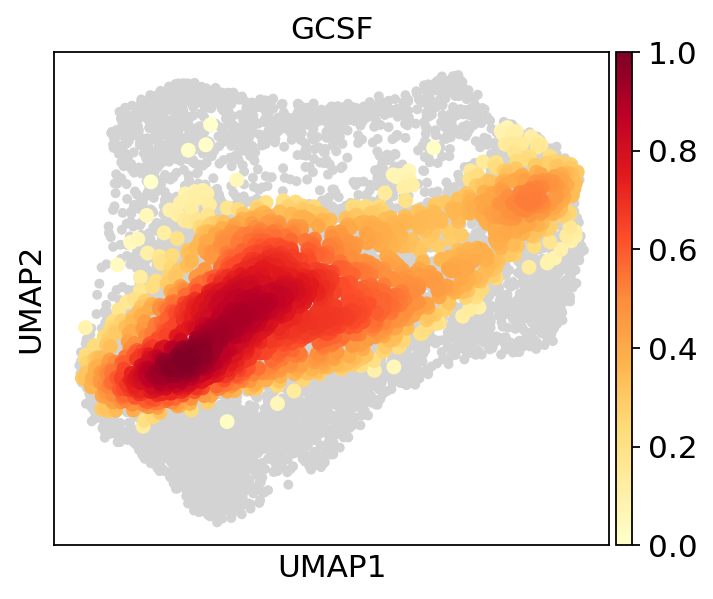

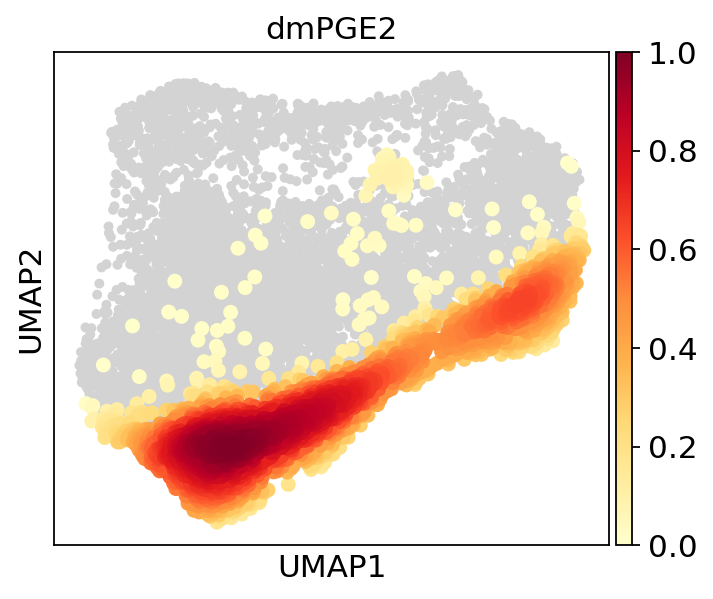

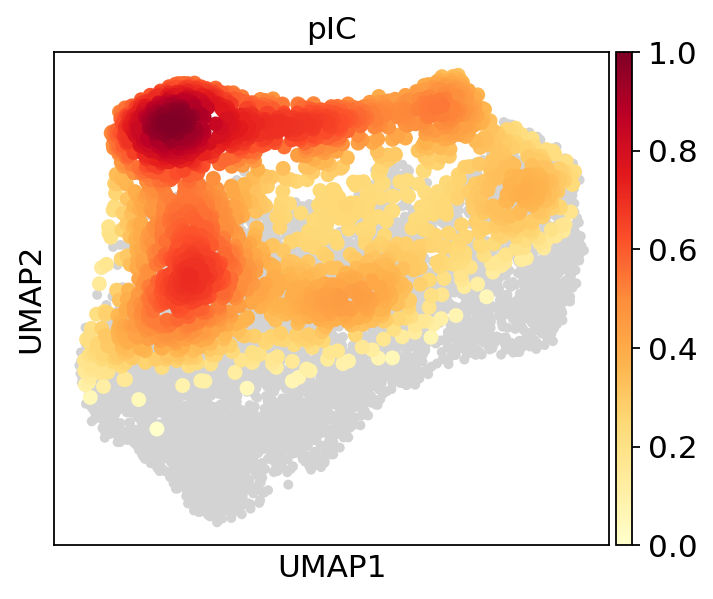

In [65]:
#see where samples localize


import scanpy as sc

#Plot the density
sc.tl.embedding_density(adata, basis='umap', groupby='sample')

adata.obs['sample'].value_counts()
sc.pl.embedding_density(adata, basis='umap', key='umap_density_sample', group='ct')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_sample', group='indo')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_sample', group='GCSF')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_sample', group='dmPGE2')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_sample', group='pIC')

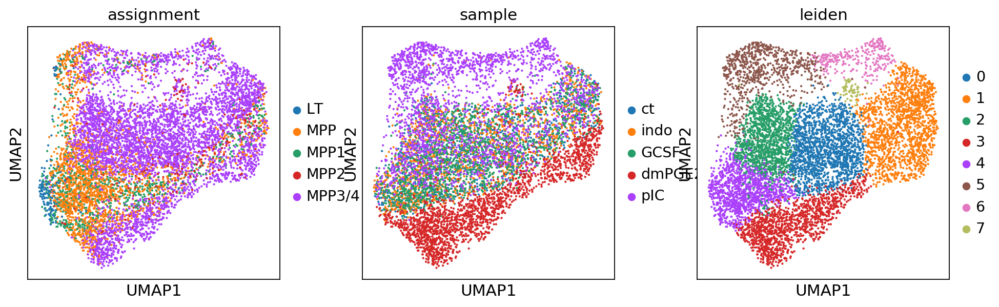

In [66]:
sc.pl.umap(adata, color=['assignment', 'sample', 'leiden'])

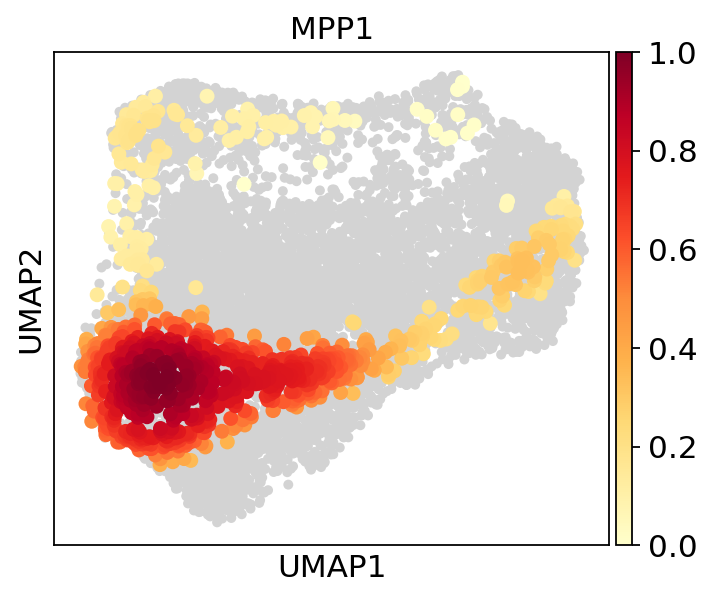

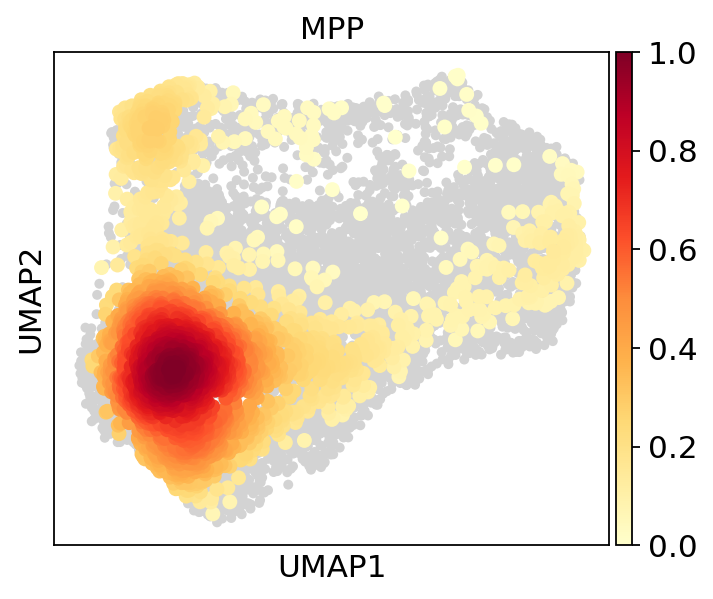

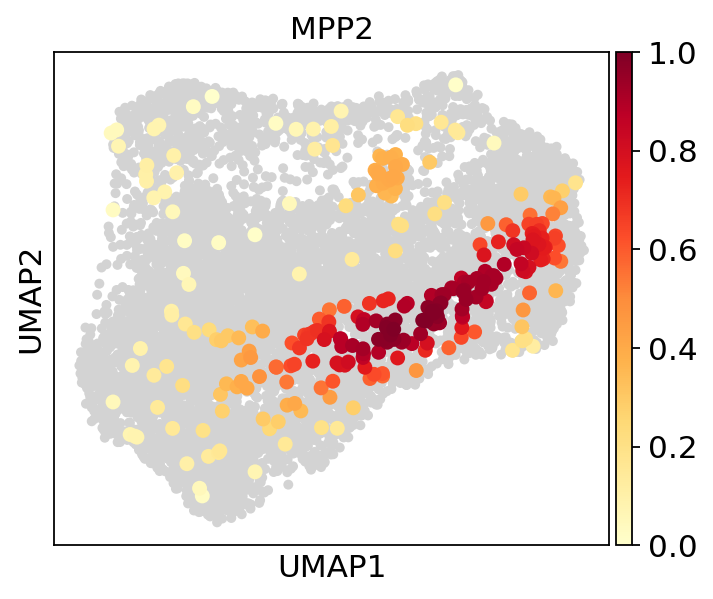

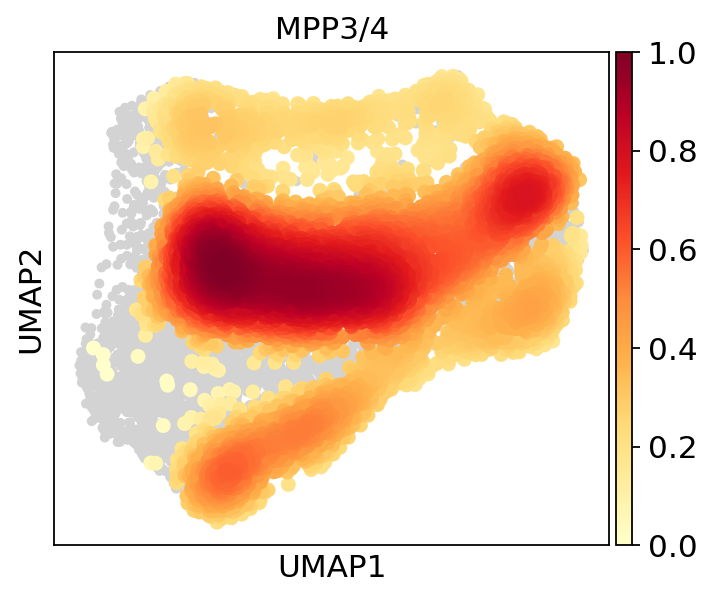

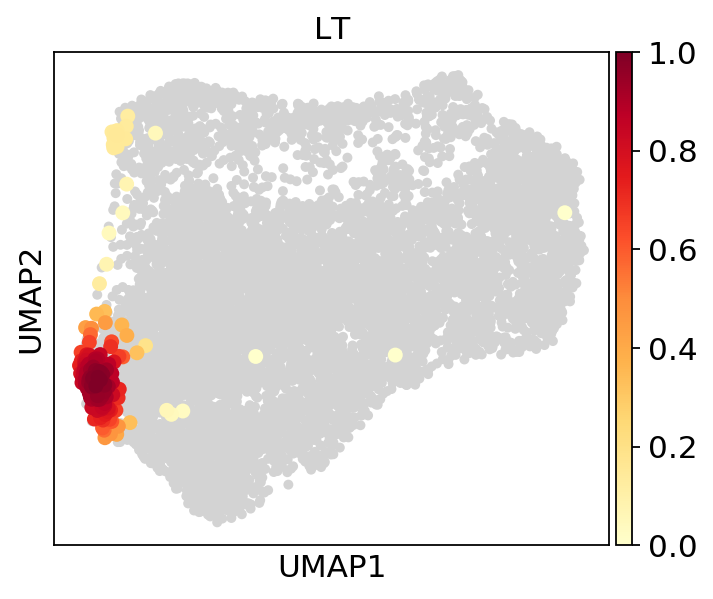

In [67]:
#Plot the density
sc.tl.embedding_density(adata, basis='umap', groupby='assignment')

adata.obs['assignment'].value_counts()
sc.pl.embedding_density(adata, basis='umap', key='umap_density_assignment', group='MPP1')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_assignment', group='MPP')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_assignment', group='MPP2')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_assignment', group='MPP3/4')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_assignment', group='LT')

In [68]:
# have to delete that otherwise there is a bug in the saving to .h5ad
adata.uns['rank_genes_groups'] = None
adata.uns['rank_genes'] = None

In [69]:
# write the file to disk
adata.write('./sc_objects/MPP_preprocessed_old_scanpy.h5ad')

In [70]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
pd.show_versions()

scanpy==1.4.4.post1 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.4 scipy==1.3.3 pandas==0.25.3 scikit-learn==0.21.3 statsmodels==0.10.2 python-igraph==0.7.1 louvain==0.6.1

INSTALLED VERSIONS
------------------
commit           : None
python           : 3.7.3.final.0
python-bits      : 64
OS               : Linux
OS-release       : 4.19.76-linuxkit
machine          : x86_64
processor        : x86_64
byteorder        : little
LC_ALL           : en_US.UTF-8
LANG             : en_US.UTF-8
LOCALE           : en_US.UTF-8

pandas           : 0.25.3
numpy            : 1.17.4
pytz             : 2019.3
dateutil         : 2.8.1
pip              : 19.3.1
setuptools       : 41.6.0.post20191101
Cython           : None
pytest           : 5.3.1
hypothesis       : None
sphinx           : None
blosc            : None
feather          : None
xlsxwriter       : None
lxml.etree       : None
html5lib         : None
pymysql          : None
psycopg2         : None
jinja2           : 2.10.3
IPython         

In [71]:
!pip list

Package                Version            
---------------------- -------------------
alembic                1.3.0              
anndata                0.6.22.post1       
anndata2ri             1.0.1              
async-generator        1.10               
attrs                  19.3.0             
backcall               0.1.0              
bleach                 3.1.0              
blinker                1.4                
certifi                2019.11.28         
certipy                0.1.3              
cffi                   1.13.2             
chardet                3.0.4              
conda                  4.7.12             
conda-package-handling 1.6.0              
cryptography           2.8                
cycler                 0.10.0             
decorator              4.4.1              
defusedxml             0.6.0              
entrypoints            0.3                
get-version            2.1                
gprofiler-official     1.0.0              
h5py       